In [ ]:
import numpy as np
from sklearn.manifold import MDS
import matplotlib.pyplot as plt

## Ajout du chemin source
import os
import sys
NumAppPath = os.path.abspath('../../NumApp')
sys.path.append(NumAppPath)

dataPath = os.path.join(NumAppPath,"dataTest")


## Paramètres 
plt.rcParams["figure.figsize"] = (15,10)


# Etude test sur 300 pièces du type 19

## Matrice de Distance
Le premier algorithme qui compare les points d'intérêts extrait par processus gaussiens permet d'obtenir une matrice des "Distance" entre chaque pièce

In [ ]:
from ImageProcessing.processing import cropToCoin

def transformDist(D:np.ndarray)->np.ndarray:
    D = np.nan_to_num(D)
    D = D + D.T
    np.fill_diagonal(D,np.min(D))
    D = D + np.abs(np.min(D))
    return D
    

In [ ]:
dataList = sorted(os.listdir(dataPath))
#print(dataList)
#img = cropToCoin(os.path.join(dataPath,dataList[197]))
#plt.imshow(img)


In [ ]:
DRaw = np.load("DistMatrixTest.npy")
D = transformDist(DRaw)
plt.imshow(D)
plt.colorbar()
plt.show()

Une valeur de distance faible correspond à des monnaies qui se ressemblent

## Représentation des valeurs 
Algorithme T-SNE (t-distributed stochastic neighbor embedding)


In [ ]:
from sklearn.manifold import TSNE

X = TSNE(n_components=2, learning_rate='auto',metric='precomputed', init='random',square_distances=True).fit_transform(D)

plt.scatter(X[:,0],X[:,1])
plt.title("T-SNE visualisation 93 monnaies")
plt.xticks([], [])
plt.yticks([], [])
plt.show()

## Algorithme DBSCAN

density-based spatial clustering of applications with noise

In [ ]:
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=25, min_samples=2,metric='precomputed')
C = db.fit_predict(D)

In [ ]:
def getClusterIdx(C:np.ndarray,plot=False)->list:
    nbCluster = len(set(C)) - (1 if -1 in C else 0)
    Clusters = []

    #plot points non classées
    Cl0 = X[np.argwhere(C==-1).ravel()]
    if plot: plt.scatter(Cl0[:,0],Cl0[:,1],c='gray',label="non classées",s=5)

    for i in range(nbCluster):
        Cli = np.argwhere(C==i).ravel()
        CliCoord = X[Cli]
        Clusters.append(Cli)
        if plot : plt.scatter(CliCoord[:,0],CliCoord[:,1],label = "Cluster %d"%(i+1))

    if plot:
        plt.legend()
        plt.xticks([], [])
        plt.yticks([], [])
        plt.show()
    
    return [nbCluster,Clusters]


In [ ]:
[nbCluster, Clusters] = getClusterIdx(C,plot=True)

300


'/usr/local/tmp/Stage/NumApp/NumApp/data19/35548 Droit.jpg'

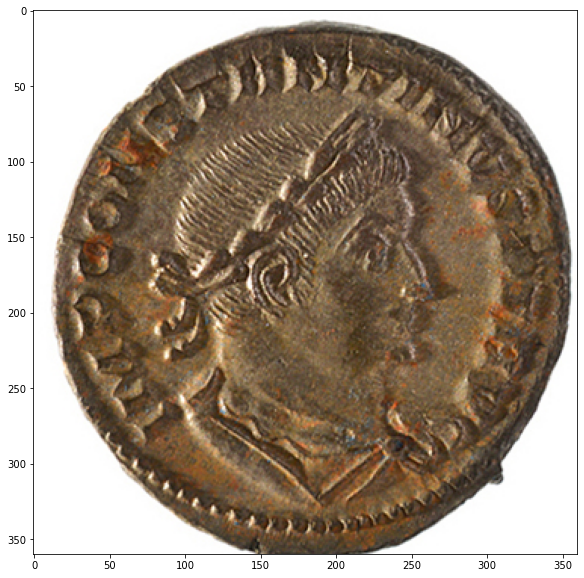

In [25]:
img = cropToCoin(os.path.join(dataPath,dataList[197]))
plt.imshow(img)

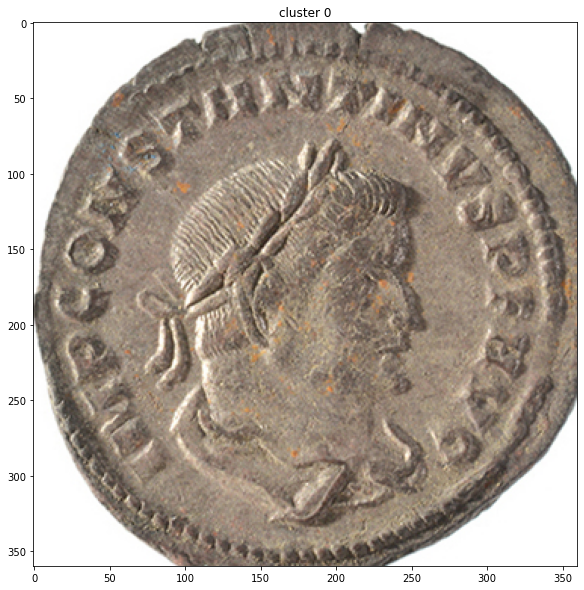

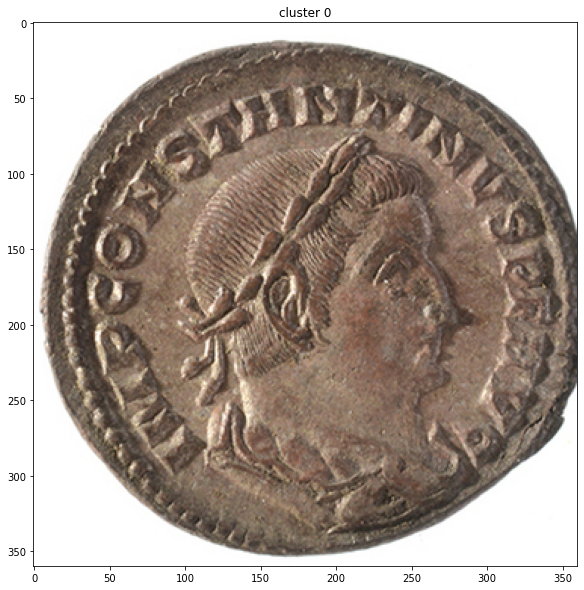

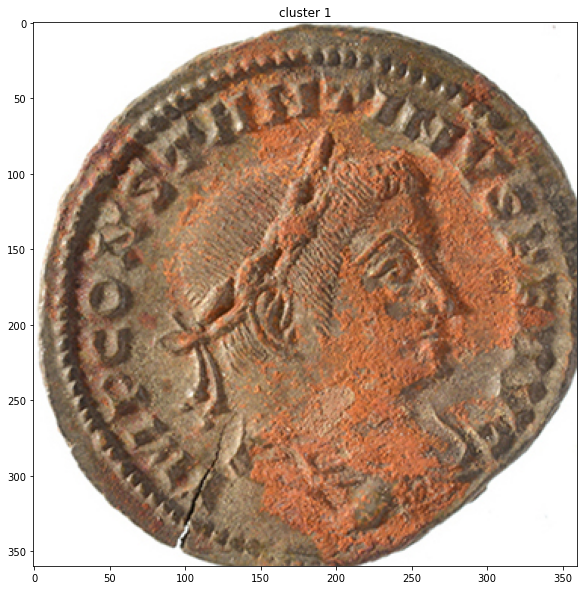

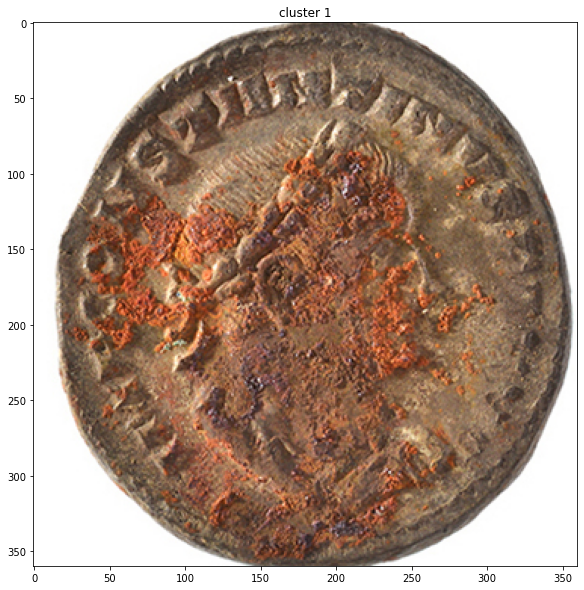

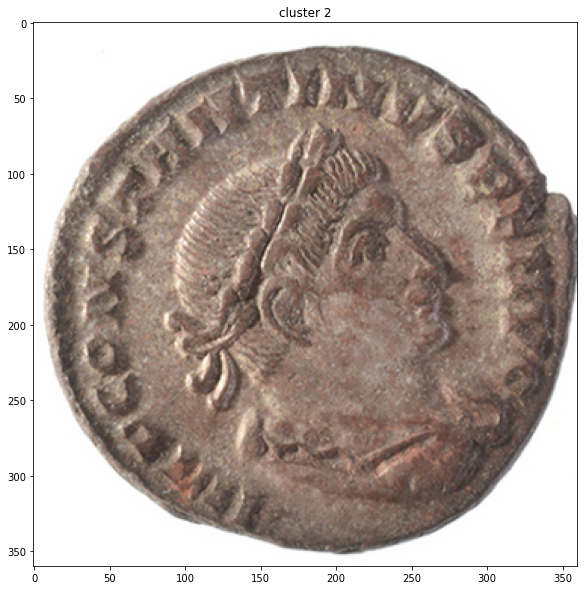

...

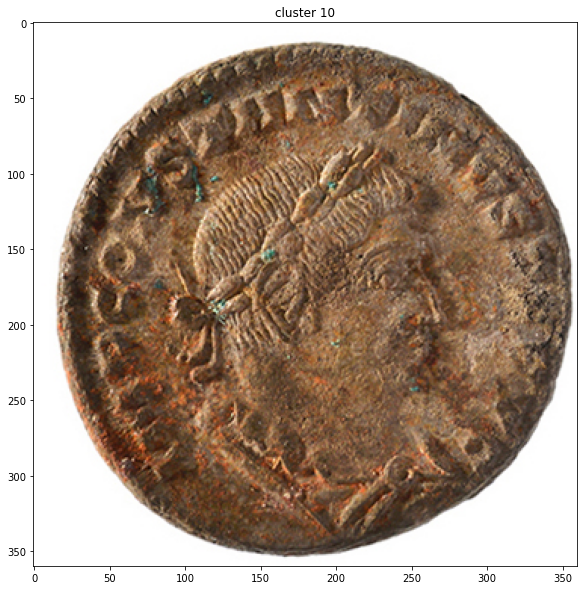

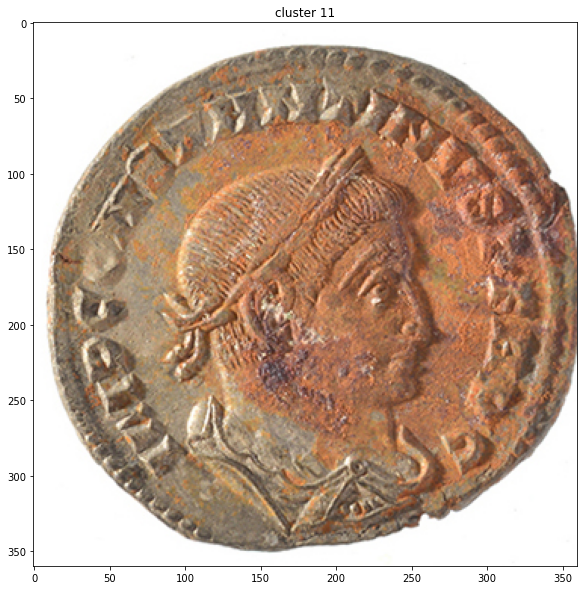

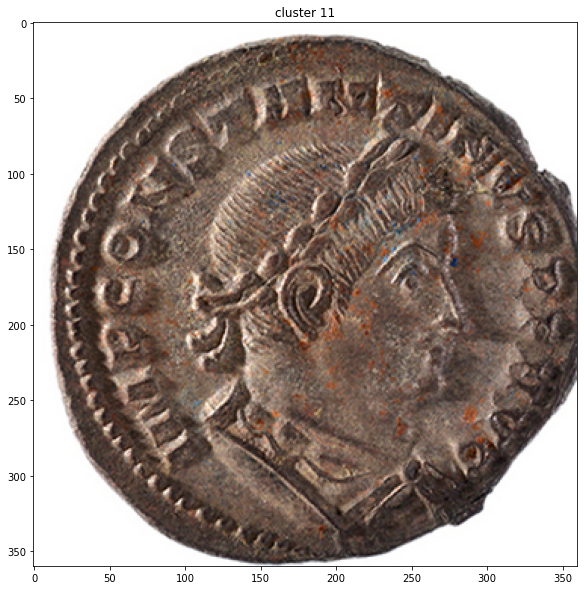

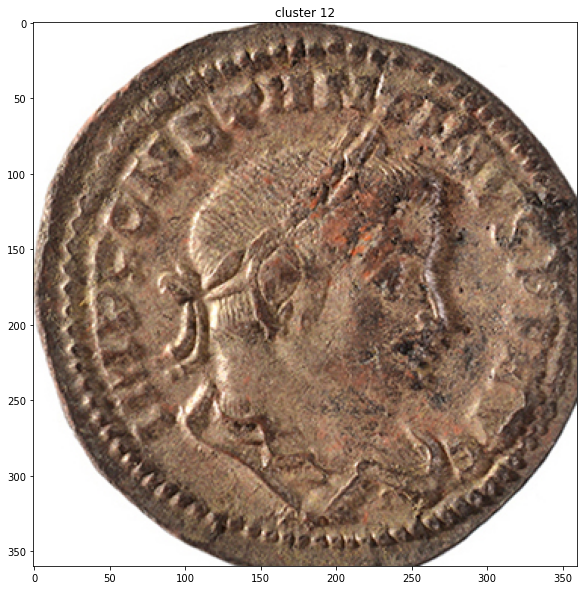

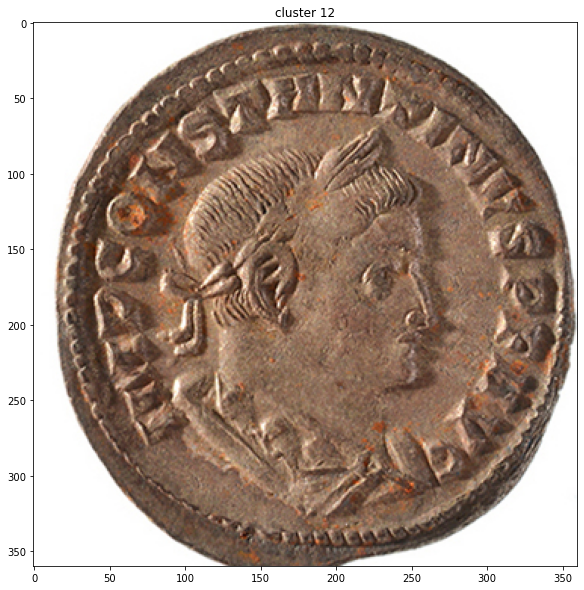

In [24]:
i = 0
for clst in Clusters:
    for idx in clst:
        plt.figure
        img = cropToCoin(os.path.join(dataPath,dataList[idx]))
        plt.imshow(img)
        plt.title("cluster %d"%i)
        plt.show()
    i=i+1

In [10]:
def getNbLiaison(Clusters):
    somme = 0
    for clst in Clusters:
        n,=np.shape(clst)
        somme = somme + int(n*(n-1)/2.0)

    return somme

print(getNbLiaison(Clusters))

15


In [11]:
def getnbClusterSize(Clusters:list,size:int)->int:
    
    s= 0
    for clst in Clusters:
        n, = np.shape(clst)
        if n == size:
            s=s+1
    return s



## Analyse de l'algorithme

Objectif trouver 



In [12]:

nbValues = 100

distList = np.linspace(1,60,nbValues)
nbClusterList = np.zeros(nbValues)
nbliaisons = np.zeros(nbValues)

nbClusterSize2 = np.zeros(nbValues)
nbClusterSize3 = np.zeros(nbValues)
nbClusterSize4 = np.zeros(nbValues)
nbClusterSize5 = np.zeros(nbValues)
nbClusterSize6 = np.zeros(nbValues)
nbClusterSize7 = np.zeros(nbValues)
nbClusterSize8 = np.zeros(nbValues)



for i in range(nbValues):
    dist = distList[i]
    db = DBSCAN(eps=dist, min_samples=2,metric='precomputed')
    C = db.fit_predict(D)
    [nbCluster, Clusters] = getClusterIdx(C,plot=False)
    
    nbClusterList[i] = nbCluster
    
    nbliaisons[i] = getNbLiaison(Clusters)
    
    nbClusterSize2[i] = getnbClusterSize(Clusters,2)
    nbClusterSize3[i] = getnbClusterSize(Clusters,3)
    nbClusterSize4[i] = getnbClusterSize(Clusters,4)
    nbClusterSize5[i] = getnbClusterSize(Clusters,5)
    nbClusterSize6[i] = getnbClusterSize(Clusters,6)
    nbClusterSize7[i] = getnbClusterSize(Clusters,7)

    
    

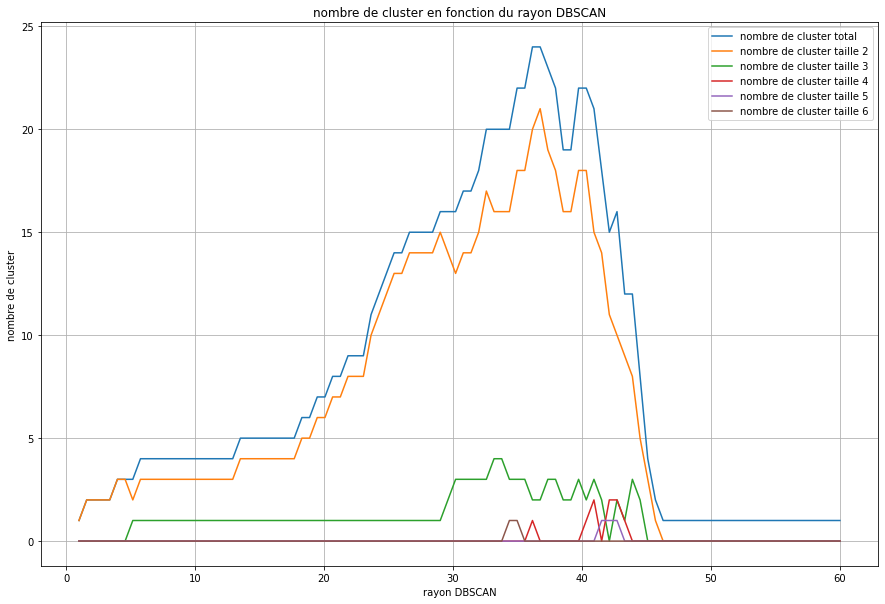

In [13]:
plt.plot(distList,nbClusterList,label="nombre de cluster total")
plt.plot(distList,nbClusterSize2,label="nombre de cluster taille 2")
plt.plot(distList,nbClusterSize3,label="nombre de cluster taille 3")
plt.plot(distList,nbClusterSize4,label="nombre de cluster taille 4")
plt.plot(distList,nbClusterSize5,label="nombre de cluster taille 5")
plt.plot(distList,nbClusterSize6,label="nombre de cluster taille 6")

plt.title("nombre de cluster en fonction du rayon DBSCAN")
plt.xlabel("rayon DBSCAN")
plt.ylabel("nombre de cluster")
plt.grid()
plt.legend()
plt.show()


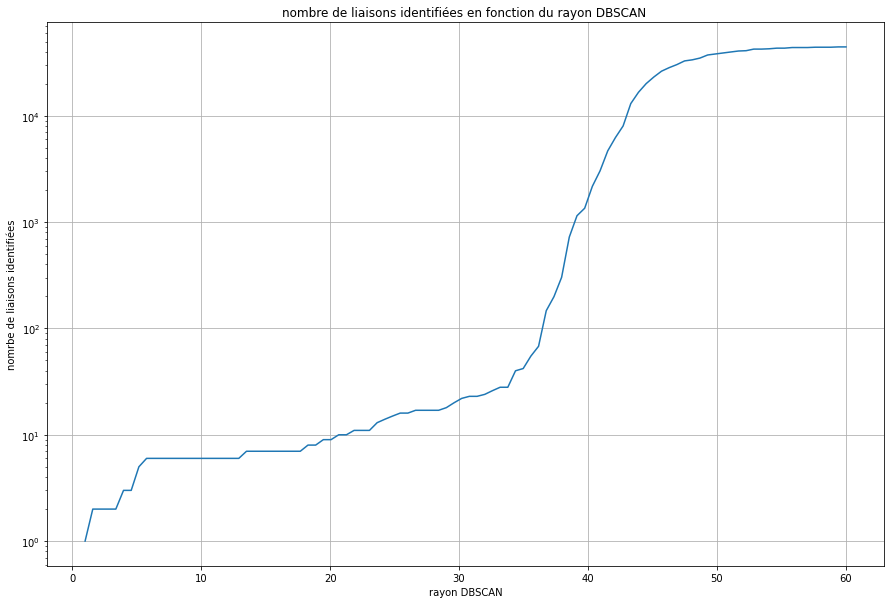

In [14]:
plt.plot(distList,nbliaisons,label="nombre de liaisons")
plt.yscale('log')
plt.title("nombre de liaisons identifiées en fonction du rayon DBSCAN ")
plt.xlabel("rayon DBSCAN")
plt.ylabel("nomrbe de liaisons identifiées")
plt.grid()